In [ ]:
!pip install torch_geometric torch_scatter torch_sparse torch_cluster torch_spline_conv


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.0/108.0 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.0/210.0 kB 18.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 47.7 MB/s eta 0:00:00
  Created wheel for torch_scatter: filename=torch_scatter-2.1.2-cp310-cp310-linux_x86_64.whl size=3879854 sha256=a3411b88ad352d93ef14969255aa43d538506fc3bb75789f1f7a062c6a8a5579
  Stored in directory: /root/.cache/pip/wheels/92/f1/2b/3b46d54b134259f58c8363568569053248040859b1a145b3ce
  Created wheel for torch_sparse: filename=torch_sparse-0.6.18-cp310-cp310-linux_x86_64.whl size=2699703 sha256=49653e98b38009f5967e9a01e3697fa36152f

In [6]:
import pandas as pd
import cv2
import os
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.cluster import DBSCAN
import numpy as np
import pandas as pd
from timm import create_model
import cv2
import os
from PIL import Image
import torch_geometric.nn as pyg_nn
from torch_geometric.data import Data, DataLoader as GeoDataLoader

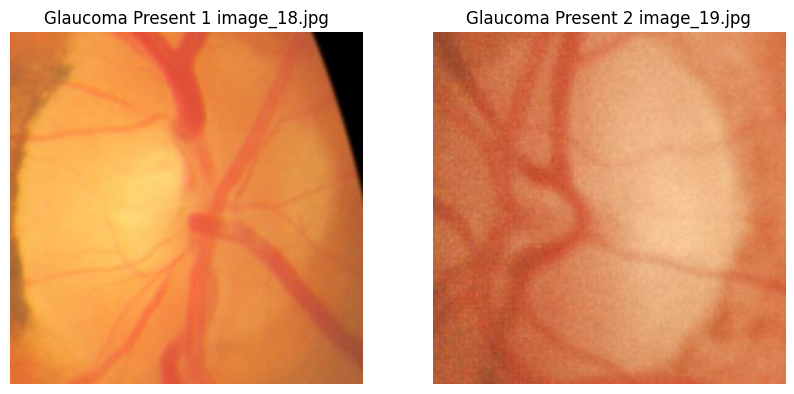

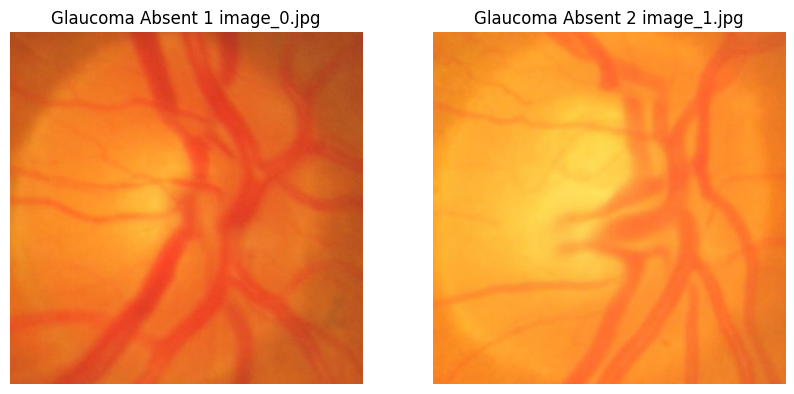

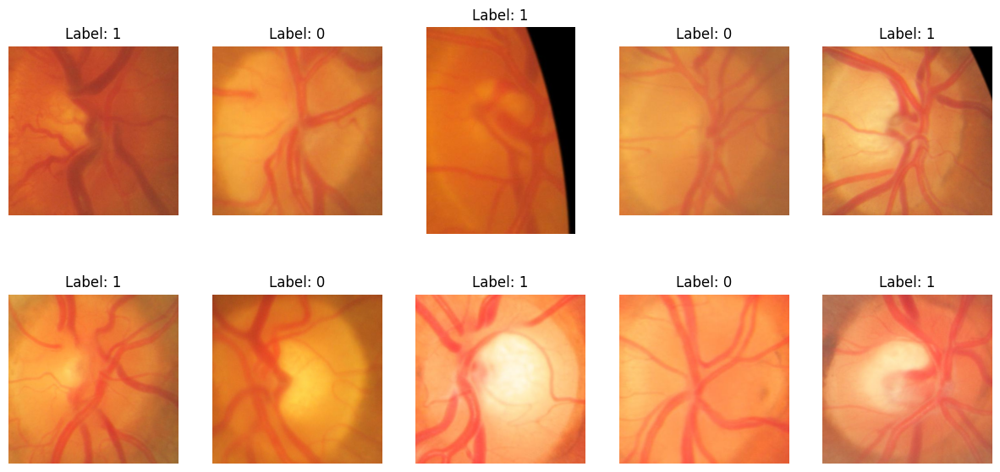

In [7]:

# Define paths
csv_path = "/kaggle/input/glaucoma-datasets/G1020/G1020.csv"
image_folder = "/kaggle/input/glaucoma-datasets/G1020/Images_Cropped/img"

# Load CSV
df = pd.read_csv(csv_path)

# Ensure column names are correct
image_column = df.columns[0]  # First column (image names)
label_column = df.columns[1]  # Second column (labels)

# Get first two images labeled 1 and first two labeled 0
glaucoma_present = df[df[label_column] == 1][image_column].iloc[:2].tolist()
glaucoma_absent = df[df[label_column] == 0][image_column].iloc[:2].tolist()

# Function to display images
def display_images(image_names, title):
    plt.figure(figsize=(10, 5))
    for i, image_name in enumerate(image_names):
        img_path = os.path.join(image_folder, image_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for correct display
        
        plt.subplot(1, 2, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"{title} {i+1} {image_name}")
    
    plt.show()

# Display images
display_images(glaucoma_present, "Glaucoma Present")
display_images(glaucoma_absent, "Glaucoma Absent")


random_samples = df.sample(n=10, random_state=42)  # Set seed for reproducibility

# Function to display images
def display_images(image_list):
    plt.figure(figsize=(15, 7))
    
    for i, (image_name, label) in enumerate(zip(image_list[image_column], image_list[label_column])):
        img_path = os.path.join(image_folder, image_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for correct display
        
        plt.subplot(2, 5, i + 1)  # Arrange in 2 rows, 5 columns
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Label: {label}")
    
    plt.show()

# Display images
display_images(random_samples)

In [14]:
import pandas as pd
df = pd.read_csv(csv_path)
print(df['binaryLabels'].value_counts())  # Check if dataset is imbalanced


binaryLabels
0    724
1    296
Name: count, dtype: int64


In [8]:
# Dataset class for image loading
class FundusDataset(Dataset):
    def __init__(self, csv_path, image_folder, transform=None):
        self.data = pd.read_csv(csv_path)
        self.image_folder = image_folder
        self.transform = transform
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        image_name = self.data.iloc[idx, 0]
        label = self.data.iloc[idx, 1]
        image_path = os.path.join(self.image_folder, image_name)
        image = preprocess_image(image_path)
        image = torch.tensor(image).permute(2, 0, 1)
        label = torch.tensor(label, dtype=torch.float32).unsqueeze(0)
        if self.transform:
            image = self.transform(image)
        return image, label

# Image Preprocessing (CLAHE for Contrast Enhancement)
def preprocess_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l = clahe.apply(l)
    lab = cv2.merge((l, a, b))
    image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    image = cv2.resize(image, (224, 224))
    image = image.astype(np.float32) / 255.0
    return image

# SimCLR Model with Graph Transformer Integration
class SimCLR(nn.Module):
    def __init__(self, base_model='vit_base_patch16_224', out_dim=128):
        super(SimCLR, self).__init__()
        self.encoder = create_model(base_model, pretrained=True, num_classes=0)
        self.projection_head = nn.Sequential(
            nn.Linear(self.encoder.num_features, 512),
            nn.ReLU(),
            nn.Linear(512, out_dim)
        )
        # Classification Head
        self.classification_head = nn.Sequential(
            nn.Linear(out_dim, 64),
            nn.LeakyReLU(0.1),  # Avoid dead neurons
            nn.Linear(64, 1)
        )

    def forward(self, x, return_features=False):
        features = self.encoder(x)
        projections = self.projection_head(features)
        if return_features:
            return projections
        classifications = self.classification_head(projections)
        return classifications

# Graph Transformer Model for Semi-Supervised Learning
class GraphTransformer(nn.Module):
    def __init__(self, in_dim, hidden_dim, num_layers=3):
        super(GraphTransformer, self).__init__()
        self.conv_layers = nn.ModuleList([
            pyg_nn.TransformerConv(in_dim if i == 0 else hidden_dim, hidden_dim)
            for i in range(num_layers)
        ])
        self.fc = nn.Linear(hidden_dim, 1)  # Final prediction layer

    def forward(self, x, edge_index):
        for conv in self.conv_layers:
            x = conv(x, edge_index).relu()
        return self.fc(x)

# Training function
def train_model(model, dataloader, epochs=10, lr=1e-4, save_path="model.pth"):
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.train()
    
    for epoch in range(epochs):
        total_loss = 0
        for batch_idx, (images, labels) in enumerate(dataloader):
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            
            if batch_idx % 10 == 0:
                print(f"Epoch [{epoch+1}/{epochs}], Batch [{batch_idx}/{len(dataloader)}], "
                      f"Loss: {loss.item():.4f}")
        
        avg_loss = total_loss / len(dataloader)
        print(f"Epoch [{epoch+1}/{epochs}], Average Loss: {avg_loss:.4f}")
    
    torch.save(model.state_dict(), save_path)
    print(f"Model saved to {save_path}")

# Feature extraction for DBSCAN clustering
def extract_features(model, dataloader):
    model.eval()
    features_list = []
    with torch.no_grad():
        for images, _ in dataloader:
            images = images.to(next(model.parameters()).device)
            features = model(images, return_features=True)
            features_list.append(features.cpu().numpy())
    return np.concatenate(features_list)

# Construct Graph Data from Clustering
def create_graph_data(features, eps=0.5, min_samples=5):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    pseudo_labels = dbscan.fit_predict(features)
    
    # Convert feature vectors to graph nodes
    nodes = torch.tensor(features, dtype=torch.float32)
    edge_index = []
    
    for i in range(len(pseudo_labels)):
        for j in range(len(pseudo_labels)):
            if pseudo_labels[i] == pseudo_labels[j] and i != j:
                edge_index.append([i, j])

    edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()
    data = Data(x=nodes, edge_index=edge_index)
    return data, pseudo_labels

# Train Graph Transformer Model
def train_graph_transformer(graph_model, graph_data, pseudo_labels, epochs=5, lr=1e-3):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    graph_model.to(device)
    optimizer = optim.Adam(graph_model.parameters(), lr=lr)
    criterion = nn.BCEWithLogitsLoss()

    for epoch in range(epochs):
        optimizer.zero_grad()
        x, edge_index = graph_data.x.to(device), graph_data.edge_index.to(device)
        labels = torch.tensor(pseudo_labels, dtype=torch.float32).to(device).unsqueeze(1)
        outputs = graph_model(x, edge_index)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

# Main Execution
if __name__ == "__main__":
    transform = transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),
    ])
    
    csv_path = "/kaggle/input/glaucoma-datasets/G1020/G1020.csv"
    image_folder = "/kaggle/input/glaucoma-datasets/G1020/Images_Cropped/img"
    dataset = FundusDataset(csv_path, image_folder, transform=transform)
    dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

    simclr = SimCLR()
    train_model(simclr, dataloader, epochs=5, save_path="simclr_model.pth")

    features = extract_features(simclr, dataloader)
    graph_data, pseudo_labels = create_graph_data(features)

    graph_transformer = GraphTransformer(in_dim=128, hidden_dim=64)
    train_graph_transformer(graph_transformer, graph_data, pseudo_labels)


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Epoch [1/5], Batch [0/128], Loss: 0.6914
Epoch [1/5], Batch [10/128], Loss: 0.7113
Epoch [1/5], Batch [20/128], Loss: 0.6647
Epoch [1/5], Batch [30/128], Loss: 1.0249
Epoch [1/5], Batch [40/128], Loss: 0.3612
Epoch [1/5], Batch [50/128], Loss: 0.6749
Epoch [1/5], Batch [60/128], Loss: 0.4263
Epoch [1/5], Batch [70/128], Loss: 0.8017
Epoch [1/5], Batch [80/128], Loss: 0.6767
Epoch [1/5], Batch [90/128], Loss: 0.5708
Epoch [1/5], Batch [100/128], Loss: 0.7364
Epoch [1/5], Batch [110/128], Loss: 0.7502
Epoch [1/5], Batch [120/128], Loss: 0.6728
Epoch [1/5], Average Loss: 0.6130
Epoch [2/5], Batch [0/128], Loss: 0.6832
Epoch [2/5], Batch [10/128], Loss: 0.8389
Epoch [2/5], Batch [20/128], Loss: 0.7159
Epoch [2/5], Batch [30/128], Loss: 0.2591
Epoch [2/5], Batch [40/128], Loss: 0.5651
Epoch [2/5], Batch [50/128], Loss: 0.5701
Epoch [2/5], Batch [60/128], Loss: 0.6681
Epoch [2/5], Batch [70/128], Loss: 0.5627
Epoch [2/5], Batch [80/128], Loss: 0.4571
Epoch [2/5], Batch [90/128], Loss: 0.6653

<ipython-input-17-d9920afaa765>:79: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


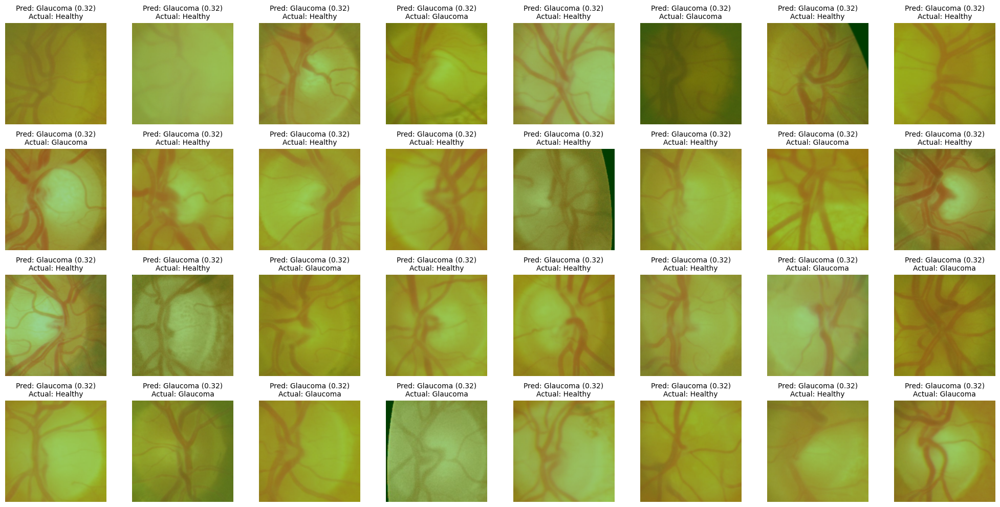

In [17]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, random_split
import numpy as np
import pandas as pd
import cv2
import os
import matplotlib.pyplot as plt
from timm import create_model
from sklearn.metrics import accuracy_score, roc_auc_score
from PIL import Image

# Dataset class for loading fundus images
class FundusDataset(Dataset):
    def __init__(self, csv_path, image_folder, transform=None):
        self.data = pd.read_csv(csv_path)
        self.image_folder = image_folder
        self.transform = transform
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        image_name = self.data.iloc[idx, 0]
        label = self.data.iloc[idx, 1]  # 0 = Healthy, 1 = Glaucoma
        image_path = os.path.join(self.image_folder, image_name)
        image = preprocess_image(image_path)
        image = torch.tensor(image).permute(2, 0, 1)
        label = torch.tensor(label, dtype=torch.float32).unsqueeze(0)
        if self.transform:
            image = self.transform(image)
        return image, label, image_name  # Return image name for visualization

# Image preprocessing function
def preprocess_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l = clahe.apply(l)
    lab = cv2.merge((l, a, b))
    image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    image = cv2.resize(image, (224, 224))
    image = image.astype(np.float32) / 255.0
    return image

# SimCLR Model with Classification Head
class SimCLR(nn.Module):
    def __init__(self, base_model='vit_base_patch16_224', out_dim=128):
        super(SimCLR, self).__init__()
        self.encoder = create_model(base_model, pretrained=True, num_classes=0)
        self.projection_head = nn.Sequential(
            nn.Linear(self.encoder.num_features, 512),
            nn.ReLU(),
            nn.Linear(512, out_dim)
        )
        self.classification_head = nn.Sequential(
            nn.Linear(out_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 1)  # Output single value for binary classification
        )
    
    def forward(self, x, return_features=False):
        features = self.encoder(x)
        projections = self.projection_head(features)
        if return_features:
            return projections
        classifications = self.classification_head(projections)
        return classifications

# Load trained model
def load_model(model_path):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = SimCLR().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()
    return model

# Function to visualize predictions vs actual labels
def visualize_predictions(model, dataloader, num_images=32):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))  # 4 rows × 8 columns = 32 images
    axes = axes.flatten()
    
    with torch.no_grad():
        image_count = 0
        
        for images, labels, image_names in dataloader:
            images = images.to(device)
            outputs = model(images)
            predictions = torch.sigmoid(outputs).cpu().numpy().flatten()
            
            for i in range(len(images)):
                if image_count >= num_images:
                    break
                
                # Load original image
                image_path = os.path.join(image_folder, image_names[i])
                image_cv = cv2.imread(image_path)
                image_cv = cv2.resize(image_cv, (224, 224))
                
                # Overlay red for glaucoma, green for healthy
                overlay = np.zeros_like(image_cv, dtype=np.uint8)
                predicted_class = "Glaucoma" if predictions[i] > 0.3 else "Healthy"
                actual_class = "Glaucoma" if labels[i].item() == 1 else "Healthy"
                
                if predictions[i] > 0.5:
                    overlay[:, :, 2] = 150  # Red overlay for glaucoma
                else:
                    overlay[:, :, 1] = 150  # Green overlay for healthy
                
                blended = cv2.addWeighted(image_cv, 0.6, overlay, 0.4, 0)
                
                # Display image with prediction vs actual label
                axes[image_count].imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
                axes[image_count].set_title(f"Pred: {predicted_class} ({predictions[i]:.2f})\nActual: {actual_class}", fontsize=10)
                axes[image_count].axis("off")
                
                image_count += 1
            
            if image_count >= num_images:
                break
    
    plt.tight_layout()
    plt.show()

# Main execution
if __name__ == "__main__":
    # Load dataset
    csv_path = "/kaggle/input/glaucoma-datasets/G1020/G1020.csv"  
    image_folder = "/kaggle/input/glaucoma-datasets/G1020/Images_Cropped/img"
    
    transform = transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),
    ])
    
    dataset = FundusDataset(csv_path, image_folder, transform=transform)
    
    # Split dataset (70% train, 15% validation, 15% test)
    train_size = int(0.7 * len(dataset))
    val_size = int(0.15 * len(dataset))
    test_size = len(dataset) - train_size - val_size
    train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])
    
    train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)
    
    # Load trained model
    model_path = "simclr_model.pth"
    model = load_model(model_path)
    
    # Visualize predictions vs actual labels
    visualize_predictions(model, test_loader, num_images=32)


Class distribution: Healthy=724, Glaucoma=296


model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

Using device: cuda


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/30], Batch [10/45], Loss: 0.6815
Epoch [1/30], Batch [20/45], Loss: 0.6657
Epoch [1/30], Batch [30/45], Loss: 0.6648
Epoch [1/30], Batch [40/45], Loss: 0.6659
Epoch [1/30] completed in 7.9s
Train Loss: 0.6859, Val Loss: 0.6793
Val Acc: 0.6340, Val AUC: 0.5343, Val F1: 0.2821
Val Precision: 0.3667, Val Recall: 0.2292
Model saved with Val AUC: 0.5343
------------------------------------------------------------
Epoch [2/30], Batch [10/45], Loss: 0.6886
Epoch [2/30], Batch [20/45], Loss: 0.6534
Epoch [2/30], Batch [30/45], Loss: 0.6374
Epoch [2/30], Batch [40/45], Loss: 0.5853
Epoch [2/30] completed in 7.3s
Train Loss: 0.6394, Val Loss: 0.6713
Val Acc: 0.6209, Val AUC: 0.5548, Val F1: 0.2750
Val Precision: 0.3438, Val Recall: 0.2292
Model saved with Val AUC: 0.5548
------------------------------------------------------------
Epoch [3/30], Batch [10/45], Loss: 0.5004
Epoch [3/30], Batch [20/45], Loss: 0.5448
Epoch [3/30], Batch [30/45], Loss: 0.4996
Epoch [3/30], Batch [40/45], Los

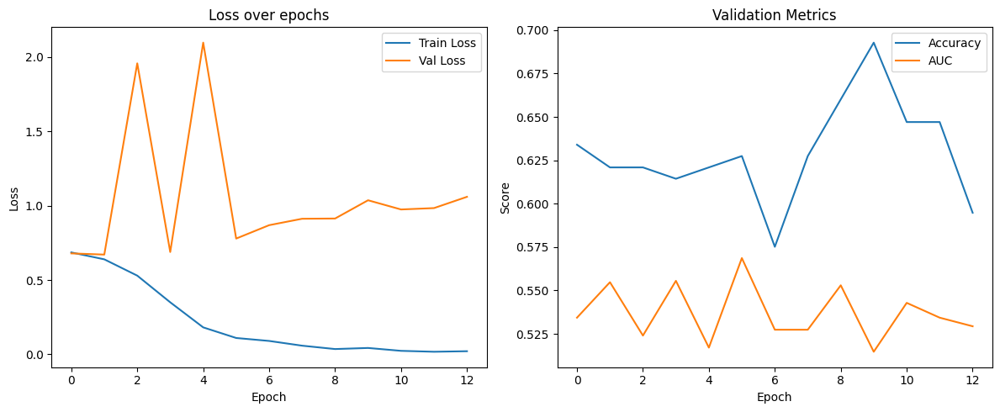

<ipython-input-18-6a3f09ed3ce4>:261: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(save_path)


Loaded best model from epoch 6 with Val AUC: 0.5687

Test Results:
Accuracy: 0.5948
AUC: 0.4478
Precision: 0.1923
Recall: 0.1087
F1 Score: 0.1389


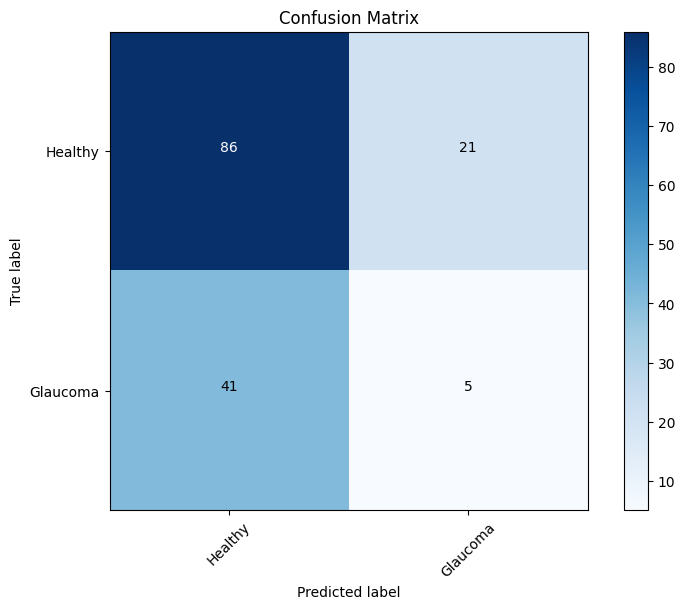

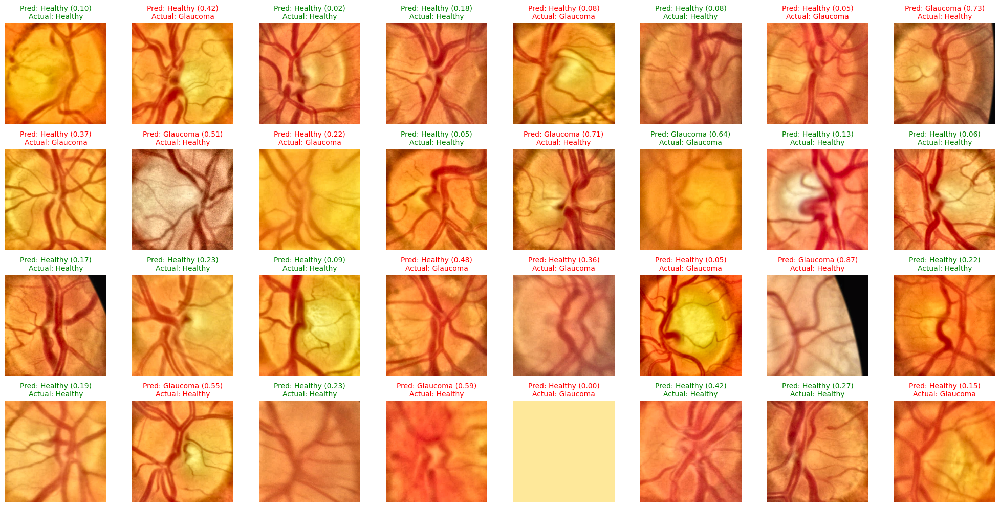


Misclassified examples:
Image: image_2470.jpg, Prediction: 0.4210, Actual: 1
Image: image_1862.jpg, Prediction: 0.0812, Actual: 1
Image: image_2532.jpg, Prediction: 0.0499, Actual: 1
Image: image_1616.jpg, Prediction: 0.7285, Actual: 0
Image: image_1334.jpg, Prediction: 0.3684, Actual: 1
Image: image_2291.jpg, Prediction: 0.5073, Actual: 0
Image: image_1895.jpg, Prediction: 0.2193, Actual: 1
Image: image_571.jpg, Prediction: 0.7112, Actual: 0
Image: image_1319.jpg, Prediction: 0.4774, Actual: 1
Image: image_1874.jpg, Prediction: 0.3618, Actual: 1


In [18]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, random_split, WeightedRandomSampler
import numpy as np
import pandas as pd
import cv2
import os
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from timm import create_model
import time

# Dataset class with improved preprocessing
class FundusDataset(Dataset):
    def __init__(self, csv_path, image_folder, transform=None, phase='train'):
        self.data = pd.read_csv(csv_path)
        self.image_folder = image_folder
        self.transform = transform
        self.phase = phase
        
        # Print class distribution
        class_counts = self.data.iloc[:, 1].value_counts()
        print(f"Class distribution: Healthy={class_counts.get(0, 0)}, Glaucoma={class_counts.get(1, 0)}")
        
        # Calculate class weights for balanced sampling
        self.class_weights = 1.0 / class_counts
        self.sample_weights = [self.class_weights[label] for label in self.data.iloc[:, 1]]
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        image_name = self.data.iloc[idx, 0]
        label = self.data.iloc[idx, 1]  # 0 = Healthy, 1 = Glaucoma
        image_path = os.path.join(self.image_folder, image_name)
        
        # Enhanced preprocessing
        image = self.preprocess_image(image_path)
        
        # Convert to tensor
        image = torch.tensor(image).permute(2, 0, 1).float()
        label = torch.tensor(label, dtype=torch.float32).unsqueeze(0)
        
        # Apply transformations
        if self.transform and self.phase == 'train':
            image = self.transform(image)
            
        return image, label, image_name

    def preprocess_image(self, image_path):
        # Read image
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        if image is None:
            print(f"Warning: Could not read image {image_path}")
            # Return a blank image if file can't be read
            return np.zeros((224, 224, 3), dtype=np.float32)
            
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Apply CLAHE for contrast enhancement
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        lab = cv2.merge((l, a, b))
        image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
        
        # Resize
        image = cv2.resize(image, (224, 224))
        
        # Normalize
        image = image.astype(np.float32) / 255.0
        
        # Additional normalization to match ImageNet stats
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = (image - mean) / std
        
        return image

# Improved model architecture
class GlaucomaNet(nn.Module):
    def __init__(self, base_model='efficientnet_b3', pretrained=True):
        super(GlaucomaNet, self).__init__()
        # Use EfficientNet instead of ViT for better performance on medical images
        self.backbone = create_model(base_model, pretrained=pretrained, num_classes=0)
        feature_dim = self.backbone.num_features
        
        # Feature projection with batch normalization
        self.projection = nn.Sequential(
            nn.Linear(feature_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2)
        )
        
        # Classification head
        self.classifier = nn.Sequential(
            nn.Linear(256, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Linear(64, 1)
        )
        
    def forward(self, x):
        features = self.backbone(x)
        projected = self.projection(features)
        output = self.classifier(projected)
        return output
    
    def get_features(self, x):
        features = self.backbone(x)
        projected = self.projection(features)
        return projected

# Training function with learning rate scheduling and early stopping
def train_model(model, train_loader, val_loader, epochs=30, lr=1e-4, save_path="glaucoma_model.pth"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    model = model.to(device)
    
    # Weighted BCE loss to handle class imbalance
    criterion = nn.BCEWithLogitsLoss()
    
    # AdamW optimizer with weight decay
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
    
    # Learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)
    
    # Early stopping
    best_val_loss = float('inf')
    best_val_auc = 0
    patience = 7
    counter = 0
    
    # Training history
    history = {
        'train_loss': [],
        'val_loss': [],
        'val_acc': [],
        'val_auc': []
    }
    
    for epoch in range(epochs):
        start_time = time.time()
        
        # Training phase
        model.train()
        train_loss = 0
        for batch_idx, (images, labels, _) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)
            
            # Zero gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(images)
            
            # Calculate loss
            loss = criterion(outputs, labels)
            
            # Backward pass and optimize
            loss.backward()
            
            # Gradient clipping to prevent exploding gradients
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            
            train_loss += loss.item()
            
            # Print progress
            if (batch_idx + 1) % 10 == 0:
                print(f"Epoch [{epoch+1}/{epochs}], Batch [{batch_idx+1}/{len(train_loader)}], Loss: {loss.item():.4f}")
        
        avg_train_loss = train_loss / len(train_loader)
        history['train_loss'].append(avg_train_loss)
        
        # Validation phase
        model.eval()
        val_loss = 0
        all_preds = []
        all_labels = []
        
        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                
                # Store predictions and labels for metrics calculation
                probs = torch.sigmoid(outputs).cpu().numpy()
                all_preds.extend(probs)
                all_labels.extend(labels.cpu().numpy())
        
        avg_val_loss = val_loss / len(val_loader)
        history['val_loss'].append(avg_val_loss)
        
        # Convert to numpy arrays for metric calculation
        all_preds = np.array(all_preds).flatten()
        all_labels = np.array(all_labels).flatten()
        
        # Calculate metrics
        val_preds_binary = (all_preds > 0.5).astype(int)
        val_acc = accuracy_score(all_labels, val_preds_binary)
        val_auc = roc_auc_score(all_labels, all_preds)
        val_precision = precision_score(all_labels, val_preds_binary, zero_division=0)
        val_recall = recall_score(all_labels, val_preds_binary, zero_division=0)
        val_f1 = f1_score(all_labels, val_preds_binary, zero_division=0)
        
        history['val_acc'].append(val_acc)
        history['val_auc'].append(val_auc)
        
        # Update learning rate
        scheduler.step(avg_val_loss)
        
        # Print epoch results
        time_elapsed = time.time() - start_time
        print(f"Epoch [{epoch+1}/{epochs}] completed in {time_elapsed:.1f}s")
        print(f"Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
        print(f"Val Acc: {val_acc:.4f}, Val AUC: {val_auc:.4f}, Val F1: {val_f1:.4f}")
        print(f"Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}")
        
        # Check for improvement
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_val_loss = avg_val_loss
            counter = 0
            
            # Save best model
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': avg_val_loss,
                'val_auc': val_auc,
            }, save_path)
            print(f"Model saved with Val AUC: {val_auc:.4f}")
        else:
            counter += 1
            print(f"EarlyStopping counter: {counter} out of {patience}")
            
        if counter >= patience:
            print("Early stopping triggered")
            break
            
        print("-" * 60)
    
    # Plot training history
    plot_training_history(history)
    
    # Load best model
    checkpoint = torch.load(save_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Loaded best model from epoch {checkpoint['epoch']+1} with Val AUC: {checkpoint['val_auc']:.4f}")
    
    return model, history

# Function to plot training history
def plot_training_history(history):
    plt.figure(figsize=(12, 5))
    
    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Val Loss')
    plt.title('Loss over epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    # Plot metrics
    plt.subplot(1, 2, 2)
    plt.plot(history['val_acc'], label='Accuracy')
    plt.plot(history['val_auc'], label='AUC')
    plt.title('Validation Metrics')
    plt.xlabel('Epoch')
    plt.ylabel('Score')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Function to evaluate model on test set
def evaluate_model(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    
    all_preds = []
    all_labels = []
    all_image_names = []
    
    with torch.no_grad():
        for images, labels, image_names in test_loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy()
            
            all_preds.extend(probs)
            all_labels.extend(labels.cpu().numpy())
            all_image_names.extend(image_names)
    
    # Convert to numpy arrays
    all_preds = np.array(all_preds).flatten()
    all_labels = np.array(all_labels).flatten()
    
    # Calculate metrics
    preds_binary = (all_preds > 0.5).astype(int)
    accuracy = accuracy_score(all_labels, preds_binary)
    auc = roc_auc_score(all_labels, all_preds)
    precision = precision_score(all_labels, preds_binary, zero_division=0)
    recall = recall_score(all_labels, preds_binary, zero_division=0)
    f1 = f1_score(all_labels, preds_binary, zero_division=0)
    
    # Confusion matrix
    cm = confusion_matrix(all_labels, preds_binary)
    
    # Print results
    print("\nTest Results:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"AUC: {auc:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    classes = ['Healthy', 'Glaucoma']
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    # Add text annotations
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], 'd'),
                    horizontalalignment="center",
                    color="white" if cm[i, j] > thresh else "black")
    
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()
    
    return all_preds, all_labels, all_image_names

# Function to visualize predictions
def visualize_predictions(model, test_loader, num_images=32):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    
    all_images = []
    all_preds = []
    all_labels = []
    all_image_names = []
    
    with torch.no_grad():
        for images, labels, image_names in test_loader:
            if len(all_images) >= num_images:
                break
                
            images = images.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy().flatten()
            
            # Store batch data
            for i in range(len(images)):
                if len(all_images) >= num_images:
                    break
                    
                all_images.append(images[i].cpu().numpy())
                all_preds.append(probs[i])
                all_labels.append(labels[i].item())
                all_image_names.append(image_names[i])
    
    # Plot predictions
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))
    axes = axes.flatten()
    
    for i, (image, pred, label, image_name) in enumerate(zip(all_images, all_preds, all_labels, all_image_names)):
        # Denormalize image
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = (image.transpose(1, 2, 0) * std + mean)
        image = np.clip(image, 0, 1)
        
        # Display image
        axes[i].imshow(image)
        
        # Set title with prediction and actual label
        pred_class = "Glaucoma" if float(pred) > float(0.5) else "Healthy"
        actual_class = "Glaucoma" if label == 1 else "Healthy"
        
        # Color code the title based on correctness
        color = "green" if (pred > 0.5) == (label == 1) else "red"
        
        axes[i].set_title(f"Pred: {pred_class} ({pred:.2f})\nActual: {actual_class}", 
                         color=color, fontsize=10)
        axes[i].axis("off")
    
    plt.tight_layout()
    plt.show()
    
    # Return misclassified examples for further analysis
    misclassified = [(image_name, pred, label) for image_name, pred, label in 
                     zip(all_image_names, all_preds, all_labels) if (pred > 0.5) != (label == 1)]
    
    return misclassified

# Main execution
if __name__ == "__main__":
    # Set random seeds for reproducibility
    torch.manual_seed(42)
    np.random.seed(42)
    
    # Load dataset
    csv_path = "/kaggle/input/glaucoma-datasets/G1020/G1020.csv"
    image_folder = "/kaggle/input/glaucoma-datasets/G1020/Images_Cropped/img"
    
    # Data augmentation for training
    train_transform = transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),
    ])
    
    # Create dataset
    dataset = FundusDataset(csv_path, image_folder, transform=train_transform, phase='train')
    
    # Split dataset (70% train, 15% validation, 15% test)
    train_size = int(0.7 * len(dataset))
    val_size = int(0.15 * len(dataset))
    test_size = len(dataset) - train_size - val_size
    
    train_dataset, val_dataset, test_dataset = random_split(
        dataset, [train_size, val_size, test_size], 
        generator=torch.Generator().manual_seed(42)
    )
    
    # Update phase for validation and test datasets
    val_dataset.dataset.phase = 'val'
    test_dataset.dataset.phase = 'test'
    
    # Use weighted sampler for training to handle class imbalance
    train_indices = train_dataset.indices
    train_weights = [dataset.sample_weights[i] for i in train_indices]
    sampler = WeightedRandomSampler(train_weights, len(train_weights), replacement=True)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=16, sampler=sampler, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)
    
    # Create model
    model = GlaucomaNet(base_model='efficientnet_b3', pretrained=True)
    
    # Train model
    trained_model, history = train_model(
        model, 
        train_loader, 
        val_loader, 
        epochs=30, 
        lr=1e-4, 
        save_path="glaucoma_model_best.pth"
    )
    
    # Evaluate model on test set
    predictions, labels, image_names = evaluate_model(trained_model, test_loader)
    
    # Visualize predictions
    misclassified = visualize_predictions(trained_model, test_loader, num_images=32)
    
    # Print some misclassified examples
    print("\nMisclassified examples:")
    for image_name, pred, label in misclassified[:10]:
        print(f"Image: {image_name}, Prediction: {pred:.4f}, Actual: {int(label)}")

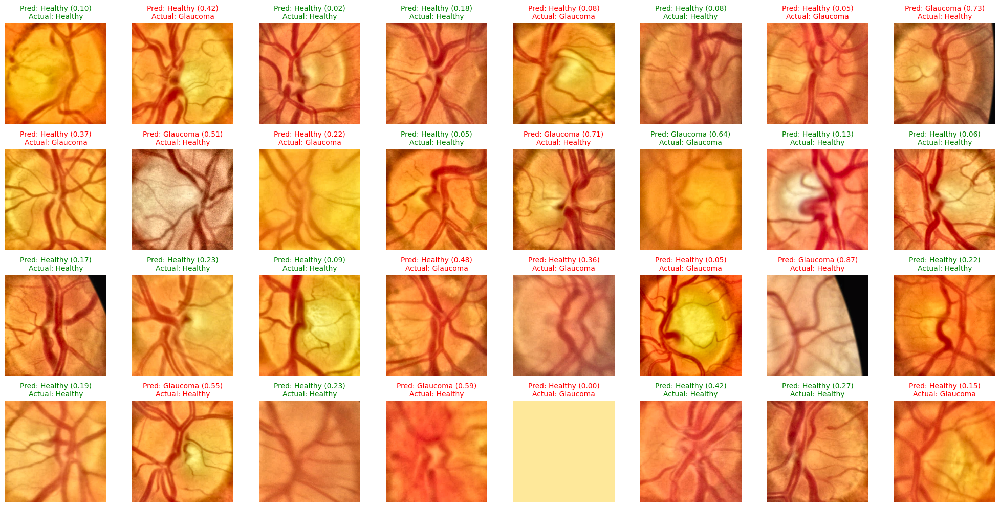


Misclassified examples:
Image: image_2470.jpg, Prediction: 0.4210, Actual: 1
Image: image_1862.jpg, Prediction: 0.0812, Actual: 1
Image: image_2532.jpg, Prediction: 0.0499, Actual: 1
Image: image_1616.jpg, Prediction: 0.7285, Actual: 0
Image: image_1334.jpg, Prediction: 0.3684, Actual: 1
Image: image_2291.jpg, Prediction: 0.5073, Actual: 0
Image: image_1895.jpg, Prediction: 0.2193, Actual: 1
Image: image_571.jpg, Prediction: 0.7112, Actual: 0
Image: image_1319.jpg, Prediction: 0.4774, Actual: 1
Image: image_1874.jpg, Prediction: 0.3618, Actual: 1


In [21]:
# Function to visualize predictions
def visualize_predictions(model, test_loader, num_images=32):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    
    all_images = []
    all_preds = []
    all_labels = []
    all_image_names = []
    
    with torch.no_grad():
        for images, labels, image_names in test_loader:
            if len(all_images) >= num_images:
                break
                
            images = images.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy().flatten()
            
            # Store batch data
            for i in range(len(images)):
                if len(all_images) >= num_images:
                    break
                    
                all_images.append(images[i].cpu().numpy())
                all_preds.append(probs[i])
                all_labels.append(labels[i].item())
                all_image_names.append(image_names[i])
    
    # Plot predictions
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))
    axes = axes.flatten()
    
    for i, (image, pred, label, image_name) in enumerate(zip(all_images, all_preds, all_labels, all_image_names)):
        # Denormalize image
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = (image.transpose(1, 2, 0) * std + mean)
        image = np.clip(image, 0, 1)
        
        # Display image
        axes[i].imshow(image)
        
        # Set title with prediction and actual label
        pred_class = "Glaucoma" if float(pred) > float(0.5) else "Healthy"
        actual_class = "Glaucoma" if label == 1 else "Healthy"
        
        # Color code the title based on correctness
        color = "green" if (pred > 0.5) == (label == 1) else "red"
        
        axes[i].set_title(f"Pred: {pred_class} ({pred:.2f})\nActual: {actual_class}", 
                         color=color, fontsize=10)
        axes[i].axis("off")
    
    plt.tight_layout()
    plt.show()
    
    # Return misclassified examples for further analysis
    misclassified = [(image_name, pred, label) for image_name, pred, label in 
                     zip(all_image_names, all_preds, all_labels) if (pred > 0.5) != (label == 1)]
    
    return misclassified


# Visualize predictions
misclassified = visualize_predictions(trained_model, test_loader, num_images=32)

# Print some misclassified examples
print("\nMisclassified examples:")
for image_name, pred, label in misclassified[:10]:
    print(f"Image: {image_name}, Prediction: {pred:.4f}, Actual: {int(label)}")

Class distribution: Healthy=724, Glaucoma=296
Class weights: Healthy=0.7044, Glaucoma=1.7230
Verifying data integrity...
All files verified successfully!


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Using device: cuda

Initial model predictions:
Prediction stats - Min: 0.9297, Max: 1.0000, Mean: 0.9995, Std: 0.0057
Predicted Healthy: 0, Predicted Glaucoma: 153
Actual Healthy: 105, Actual Glaucoma: 48
Epoch [1/30], Batch [10/45], Loss: 4.1315, LR: 0.000500
Epoch [1/30], Batch [20/45], Loss: 2.8592, LR: 0.000500
Epoch [1/30], Batch [30/45], Loss: 3.8024, LR: 0.000500
Epoch [1/30], Batch [40/45], Loss: 3.0484, LR: 0.000500
Batch loss stats - Min: 1.0096, Max: 6.6771, Mean: 2.9352, Std: 1.3530
Epoch [1/30] completed in 6.2s
Train Loss: 2.9352, Val Loss: 1.4632
Val Acc: 0.3595, Val AUC: 0.5203, Val F1: 0.4302
Val Precision: 0.2984, Val Recall: 0.7708

Prediction distribution:
Predicted Healthy: 29, Predicted Glaucoma: 124
Prediction ratio (Glaucoma/Total): 0.8105
Model saved with Val Recall: 0.7708, Val AUC: 0.5203
------------------------------------------------------------
Epoch [2/30], Batch [10/45], Loss: 2.4503, LR: 0.000452
Epoch [2/30], Batch [20/45], Loss: 2.7691, LR: 0.000452


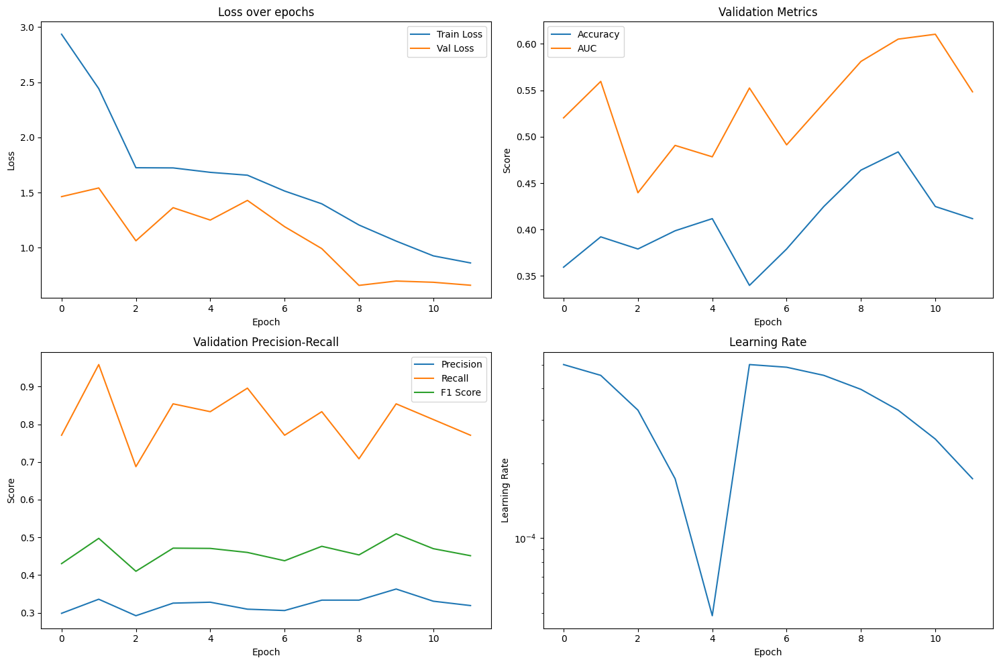

<ipython-input-22-23eabb0d5416>:382: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(save_path)


Loaded best model from epoch 2 with Val Recall: 0.9583

Threshold optimization:
Threshold: 0.1, F1: 0.4343, Recall: 0.8261, Precision: 0.2946
Threshold: 0.2, F1: 0.4277, Recall: 0.8043, Precision: 0.2913
Threshold: 0.3, F1: 0.4327, Recall: 0.8043, Precision: 0.2960
Threshold: 0.4, F1: 0.4235, Recall: 0.7826, Precision: 0.2903
Threshold: 0.5, F1: 0.4235, Recall: 0.7826, Precision: 0.2903
Threshold: 0.6, F1: 0.4235, Recall: 0.7826, Precision: 0.2903
Threshold: 0.7, F1: 0.4142, Recall: 0.7609, Precision: 0.2846
Threshold: 0.8, F1: 0.4072, Recall: 0.7391, Precision: 0.2810

Best threshold: 0.10 with F1: 0.4343

Test Results:
Accuracy: 0.3529
AUC: 0.4681
Precision: 0.2946
Recall: 0.8261
F1 Score: 0.4343


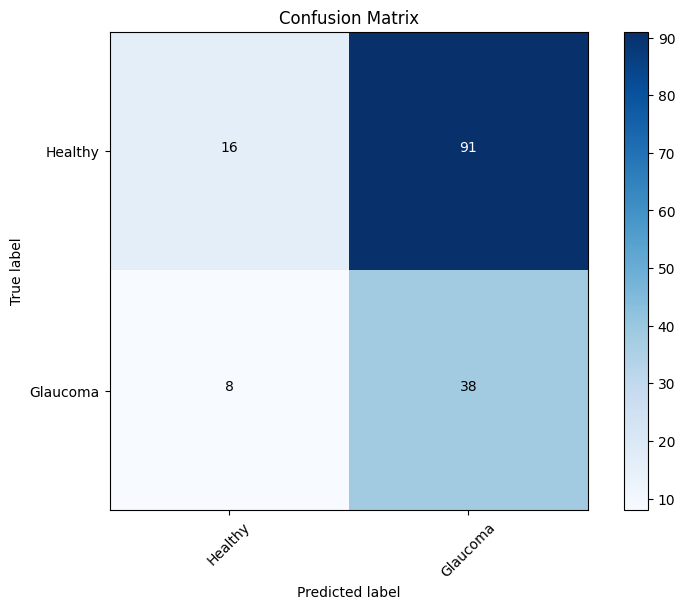

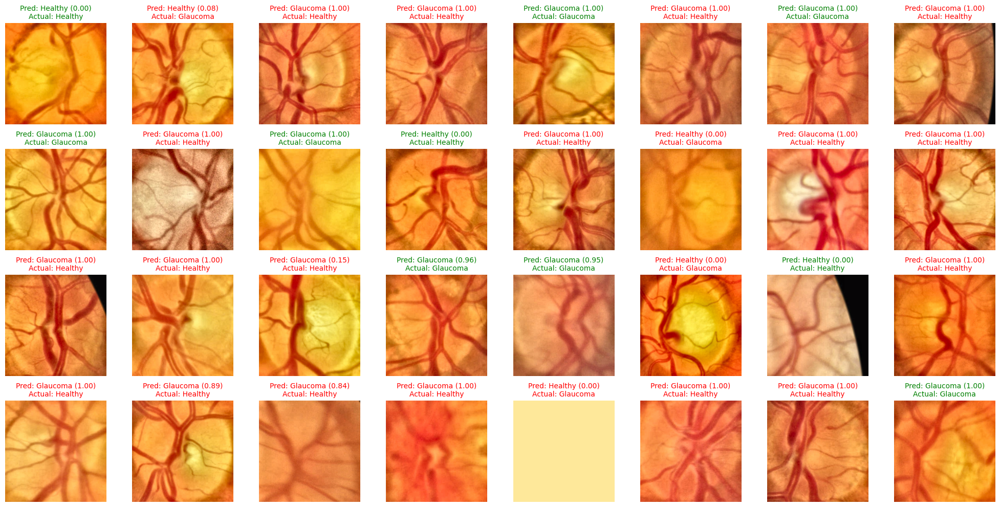


Misclassified examples:
Image: image_2470.jpg, Prediction: 0.0811, Actual: 1
Image: image_1344.jpg, Prediction: 0.9974, Actual: 0
Image: image_2078.jpg, Prediction: 1.0000, Actual: 0
Image: image_2528.jpg, Prediction: 0.9999, Actual: 0
Image: image_1616.jpg, Prediction: 1.0000, Actual: 0
Image: image_2291.jpg, Prediction: 1.0000, Actual: 0
Image: image_571.jpg, Prediction: 1.0000, Actual: 0
Image: image_1000.jpg, Prediction: 0.0027, Actual: 1
Image: image_56.jpg, Prediction: 1.0000, Actual: 0
Image: image_1978.jpg, Prediction: 1.0000, Actual: 0


In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, random_split, WeightedRandomSampler
import numpy as np
import pandas as pd
import cv2
import os
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from timm import create_model
import time
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts

# Custom loss function to heavily penalize false negatives (missing glaucoma)
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.8, gamma=2.0):
        super(FocalLoss, self).__init__()
        self.alpha = alpha  # Weight for the positive class (glaucoma)
        self.gamma = gamma  # Focusing parameter
        self.bce = nn.BCEWithLogitsLoss(reduction='none')
        
    def forward(self, inputs, targets):
        BCE_loss = self.bce(inputs, targets)
        
        # Apply focal weighting
        pt = torch.exp(-BCE_loss)
        
        # Apply class weighting - alpha for glaucoma (1), 1-alpha for healthy (0)
        alpha_weight = self.alpha * targets + (1 - self.alpha) * (1 - targets)
        
        # Calculate focal loss
        focal_loss = alpha_weight * (1 - pt) ** self.gamma * BCE_loss
        
        return focal_loss.mean()

# Dataset class with debugging capabilities
class GlaucomaDataset(Dataset):
    def __init__(self, csv_path, image_folder, transform=None, phase='train', debug=False):
        self.data = pd.read_csv(csv_path)
        self.image_folder = image_folder
        self.transform = transform
        self.phase = phase
        self.debug = debug
        
        # Print class distribution
        class_counts = self.data.iloc[:, 1].value_counts()
        print(f"Class distribution: Healthy={class_counts.get(0, 0)}, Glaucoma={class_counts.get(1, 0)}")
        
        # Calculate class weights for balanced sampling (inverse frequency)
        total = len(self.data)
        self.class_weights = {
            0: total / (2 * class_counts.get(0, 1)),  # Healthy
            1: total / (2 * class_counts.get(1, 1))   # Glaucoma
        }
        
        print(f"Class weights: Healthy={self.class_weights[0]:.4f}, Glaucoma={self.class_weights[1]:.4f}")
        
        # Create sample weights for WeightedRandomSampler
        self.sample_weights = [self.class_weights[label] for label in self.data.iloc[:, 1]]
        
        # Verify data integrity
        if debug:
            self.verify_data_integrity()
    
    def verify_data_integrity(self):
        """Check if all images exist and can be loaded"""
        print("Verifying data integrity...")
        missing_files = []
        corrupt_files = []
        
        for idx in range(len(self.data)):
            image_name = self.data.iloc[idx, 0]
            image_path = os.path.join(self.image_folder, image_name)
            
            # Check if file exists
            if not os.path.exists(image_path):
                missing_files.append(image_path)
                continue
                
            # Try to load the image
            try:
                img = cv2.imread(image_path)
                if img is None:
                    corrupt_files.append(image_path)
            except Exception as e:
                corrupt_files.append(image_path)
                
        if missing_files:
            print(f"Found {len(missing_files)} missing files")
            for path in missing_files[:5]:
                print(f"  - {path}")
                
        if corrupt_files:
            print(f"Found {len(corrupt_files)} corrupt files")
            for path in corrupt_files[:5]:
                print(f"  - {path}")
                
        if not missing_files and not corrupt_files:
            print("All files verified successfully!")
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        image_name = self.data.iloc[idx, 0]
        label = self.data.iloc[idx, 1]  # 0 = Healthy, 1 = Glaucoma
        image_path = os.path.join(self.image_folder, image_name)
        
        # Enhanced preprocessing
        image = self.preprocess_image(image_path)
        
        # Convert to tensor
        image = torch.tensor(image).permute(2, 0, 1).float()
        label = torch.tensor(label, dtype=torch.float32).unsqueeze(0)
        
        # Apply transformations
        if self.transform and self.phase == 'train':
            image = self.transform(image)
            
        return image, label, image_name

    def preprocess_image(self, image_path):
        # Read image
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        if image is None:
            print(f"Warning: Could not read image {image_path}")
            # Return a blank image if file can't be read
            return np.zeros((224, 224, 3), dtype=np.float32)
            
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Apply CLAHE for contrast enhancement
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        lab = cv2.merge((l, a, b))
        image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
        
        # Resize
        image = cv2.resize(image, (224, 224))
        
        # Normalize
        image = image.astype(np.float32) / 255.0
        
        # Additional normalization to match ImageNet stats
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = (image - mean) / std
        
        return image

# Improved model architecture with explicit initialization
class GlaucomaNet(nn.Module):
    def __init__(self, base_model='resnet50', pretrained=True):
        super(GlaucomaNet, self).__init__()
        # Use ResNet50 which is more stable for medical imaging
        self.backbone = create_model(base_model, pretrained=pretrained, num_classes=0)
        feature_dim = self.backbone.num_features
        
        # Feature projection with batch normalization
        self.projection = nn.Sequential(
            nn.Linear(feature_dim, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.3)
        )
        
        # Classification head with explicit bias initialization
        self.classifier = nn.Sequential(
            nn.Linear(256, 64),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.2),
            nn.Linear(64, 1)
        )
        
        # Initialize the final layer with bias towards glaucoma
        # This helps counter the "always predict healthy" problem
        self._initialize_weights()
        
    def _initialize_weights(self):
        # Initialize the final layer with a positive bias to favor glaucoma predictions
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='leaky_relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0.1)  # Slight positive bias
        
        # Set a stronger bias for the final layer to counter class imbalance
        final_layer = self.classifier[-1]
        if hasattr(final_layer, 'bias') and final_layer.bias is not None:
            nn.init.constant_(final_layer.bias, 1.0)  # Stronger positive bias
        
    def forward(self, x):
        features = self.backbone(x)
        projected = self.projection(features)
        output = self.classifier(projected)
        return output

# Training function with debugging and aggressive learning rate scheduling
def train_model(model, train_loader, val_loader, epochs=30, lr=1e-3, save_path="glaucoma_model.pth"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    model = model.to(device)
    
    # Use Focal Loss to focus on hard examples and address class imbalance
    criterion = FocalLoss(alpha=0.8, gamma=2.0)
    
    # AdamW optimizer with weight decay
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
    
    # Cosine annealing with warm restarts for better exploration
    scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=5, T_mult=2, eta_min=1e-6)
    
    # Early stopping
    best_val_loss = float('inf')
    best_val_auc = 0
    patience = 10
    counter = 0
    
    # Training history
    history = {
        'train_loss': [],
        'val_loss': [],
        'val_acc': [],
        'val_auc': [],
        'val_precision': [],
        'val_recall': [],
        'val_f1': [],
        'learning_rates': []
    }
    
    # Debug: Check initial predictions before training
    print("\nInitial model predictions:")
    check_predictions(model, val_loader, device)
    
    for epoch in range(epochs):
        start_time = time.time()
        current_lr = optimizer.param_groups[0]['lr']
        history['learning_rates'].append(current_lr)
        
        # Training phase
        model.train()
        train_loss = 0
        batch_losses = []
        
        for batch_idx, (images, labels, _) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)
            
            # Zero gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(images)
            
            # Calculate loss
            loss = criterion(outputs, labels)
            
            # Backward pass and optimize
            loss.backward()
            
            # Gradient clipping to prevent exploding gradients
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            
            train_loss += loss.item()
            batch_losses.append(loss.item())
            
            # Print progress
            if (batch_idx + 1) % 10 == 0:
                print(f"Epoch [{epoch+1}/{epochs}], Batch [{batch_idx+1}/{len(train_loader)}], "
                      f"Loss: {loss.item():.4f}, LR: {current_lr:.6f}")
        
        avg_train_loss = train_loss / len(train_loader)
        history['train_loss'].append(avg_train_loss)
        
        # Debug: Print batch loss statistics
        if batch_losses:
            print(f"Batch loss stats - Min: {min(batch_losses):.4f}, Max: {max(batch_losses):.4f}, "
                  f"Mean: {np.mean(batch_losses):.4f}, Std: {np.std(batch_losses):.4f}")
        
        # Validation phase
        model.eval()
        val_loss = 0
        all_preds = []
        all_labels = []
        
        with torch.no_grad():
            for images, labels, _ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                
                # Store predictions and labels for metrics calculation
                probs = torch.sigmoid(outputs).cpu().numpy()
                all_preds.extend(probs)
                all_labels.extend(labels.cpu().numpy())
        
        avg_val_loss = val_loss / len(val_loader)
        history['val_loss'].append(avg_val_loss)
        
        # Convert to numpy arrays for metric calculation
        all_preds = np.array(all_preds).flatten()
        all_labels = np.array(all_labels).flatten()
        
        # Calculate metrics
        val_preds_binary = (all_preds > 0.5).astype(int)
        val_acc = accuracy_score(all_labels, val_preds_binary)
        val_precision = precision_score(all_labels, val_preds_binary, zero_division=0)
        val_recall = recall_score(all_labels, val_preds_binary, zero_division=0)
        val_f1 = f1_score(all_labels, val_preds_binary, zero_division=0)
        
        # Calculate AUC only if both classes are present
        if len(np.unique(all_labels)) > 1:
            val_auc = roc_auc_score(all_labels, all_preds)
        else:
            val_auc = 0
            print("Warning: Only one class present in validation set")
        
        history['val_acc'].append(val_acc)
        history['val_auc'].append(val_auc)
        history['val_precision'].append(val_precision)
        history['val_recall'].append(val_recall)
        history['val_f1'].append(val_f1)
        
        # Update learning rate
        scheduler.step()
        
        # Print epoch results
        time_elapsed = time.time() - start_time
        print(f"Epoch [{epoch+1}/{epochs}] completed in {time_elapsed:.1f}s")
        print(f"Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
        print(f"Val Acc: {val_acc:.4f}, Val AUC: {val_auc:.4f}, Val F1: {val_f1:.4f}")
        print(f"Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}")
        
        # Debug: Check prediction distribution
        print("\nPrediction distribution:")
        pred_counts = np.bincount(val_preds_binary, minlength=2)
        print(f"Predicted Healthy: {pred_counts[0]}, Predicted Glaucoma: {pred_counts[1]}")
        print(f"Prediction ratio (Glaucoma/Total): {pred_counts[1]/len(val_preds_binary):.4f}")
        
        # Check for improvement - prioritize recall for medical applications
        current_metric = val_recall * 0.7 + val_auc * 0.3  # Weighted combination
        
        if current_metric > best_val_auc:
            best_val_auc = current_metric
            best_val_loss = avg_val_loss
            counter = 0
            
            # Save best model
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': avg_val_loss,
                'val_auc': val_auc,
                'val_recall': val_recall,
            }, save_path)
            print(f"Model saved with Val Recall: {val_recall:.4f}, Val AUC: {val_auc:.4f}")
        else:
            counter += 1
            print(f"EarlyStopping counter: {counter} out of {patience}")
            
        if counter >= patience:
            print("Early stopping triggered")
            break
            
        print("-" * 60)
    
    # Plot training history
    plot_training_history(history)
    
    # Load best model
    checkpoint = torch.load(save_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Loaded best model from epoch {checkpoint['epoch']+1} with Val Recall: {checkpoint['val_recall']:.4f}")
    
    return model, history

# Function to check model predictions during training
def check_predictions(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels, _ in dataloader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy().flatten()
            
            all_preds.extend(probs)
            all_labels.extend(labels.cpu().numpy().flatten())
    
    # Print prediction statistics
    print(f"Prediction stats - Min: {min(all_preds):.4f}, Max: {max(all_preds):.4f}, "
          f"Mean: {np.mean(all_preds):.4f}, Std: {np.std(all_preds):.4f}")
    
    # Count predictions by threshold
    pred_binary = (np.array(all_preds) > 0.5).astype(int)
    pred_counts = np.bincount(pred_binary, minlength=2)
    print(f"Predicted Healthy: {pred_counts[0]}, Predicted Glaucoma: {pred_counts[1]}")
    
    # Print actual label distribution
    label_counts = np.bincount(np.array(all_labels).astype(int), minlength=2)
    print(f"Actual Healthy: {label_counts[0]}, Actual Glaucoma: {label_counts[1]}")

# Function to plot training history
def plot_training_history(history):
    plt.figure(figsize=(15, 10))
    
    # Plot loss
    plt.subplot(2, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Val Loss')
    plt.title('Loss over epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    # Plot accuracy and AUC
    plt.subplot(2, 2, 2)
    plt.plot(history['val_acc'], label='Accuracy')
    plt.plot(history['val_auc'], label='AUC')
    plt.title('Validation Metrics')
    plt.xlabel('Epoch')
    plt.ylabel('Score')
    plt.legend()
    
    # Plot precision and recall
    plt.subplot(2, 2, 3)
    plt.plot(history['val_precision'], label='Precision')
    plt.plot(history['val_recall'], label='Recall')
    plt.plot(history['val_f1'], label='F1 Score')
    plt.title('Validation Precision-Recall')
    plt.xlabel('Epoch')
    plt.ylabel('Score')
    plt.legend()
    
    # Plot learning rate
    plt.subplot(2, 2, 4)
    plt.plot(history['learning_rates'])
    plt.title('Learning Rate')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.yscale('log')
    
    plt.tight_layout()
    plt.show()

# Function to evaluate model on test set
def evaluate_model(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    
    all_preds = []
    all_labels = []
    all_image_names = []
    
    with torch.no_grad():
        for images, labels, image_names in test_loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy()
            
            all_preds.extend(probs)
            all_labels.extend(labels.cpu().numpy())
            all_image_names.extend(image_names)
    
    # Convert to numpy arrays
    all_preds = np.array(all_preds).flatten()
    all_labels = np.array(all_labels).flatten()
    
    # Try different thresholds to find optimal one
    thresholds = np.arange(0.1, 0.9, 0.1)
    best_f1 = 0
    best_threshold = 0.5
    
    print("\nThreshold optimization:")
    for threshold in thresholds:
        preds_binary = (all_preds > threshold).astype(int)
        f1 = f1_score(all_labels, preds_binary, zero_division=0)
        recall = recall_score(all_labels, preds_binary, zero_division=0)
        precision = precision_score(all_labels, preds_binary, zero_division=0)
        
        print(f"Threshold: {threshold:.1f}, F1: {f1:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}")
        
        if f1 > best_f1:
            best_f1 = f1
            best_threshold = threshold
    
    print(f"\nBest threshold: {best_threshold:.2f} with F1: {best_f1:.4f}")
    
    # Use best threshold for final evaluation
    preds_binary = (all_preds > best_threshold).astype(int)
    accuracy = accuracy_score(all_labels, preds_binary)
    precision = precision_score(all_labels, preds_binary, zero_division=0)
    recall = recall_score(all_labels, preds_binary, zero_division=0)
    f1 = f1_score(all_labels, preds_binary, zero_division=0)
    
    # Calculate AUC only if both classes are present
    if len(np.unique(all_labels)) > 1:
        auc = roc_auc_score(all_labels, all_preds)
    else:
        auc = 0
    
    # Confusion matrix
    cm = confusion_matrix(all_labels, preds_binary)
    
    # Print results
    print("\nTest Results:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"AUC: {auc:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    classes = ['Healthy', 'Glaucoma']
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    # Add text annotations
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], 'd'),
                    horizontalalignment="center",
                    color="white" if cm[i, j] > thresh else "black")
    
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()
    
    return all_preds, all_labels, all_image_names, best_threshold

# Function to visualize predictions
def visualize_predictions(model, test_loader, threshold=0.5, num_images=32):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    
    all_images = []
    all_preds = []
    all_labels = []
    all_image_names = []
    
    with torch.no_grad():
        for images, labels, image_names in test_loader:
            if len(all_images) >= num_images:
                break
                
            images = images.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy().flatten()
            
            # Store batch data
            for i in range(len(images)):
                if len(all_images) >= num_images:
                    break
                    
                all_images.append(images[i].cpu().numpy())
                all_preds.append(probs[i])
                all_labels.append(labels[i].item())
                all_image_names.append(image_names[i])
    
    # Plot predictions
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))
    axes = axes.flatten()
    
    for i, (image, pred, label, image_name) in enumerate(zip(all_images, all_preds, all_labels, all_image_names)):
        # Denormalize image
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = (image.transpose(1, 2, 0) * std + mean)
        image = np.clip(image, 0, 1)
        
        # Display image
        axes[i].imshow(image)
        
        # Set title with prediction and actual label
        pred_class = "Glaucoma" if pred > threshold else "Healthy"
        actual_class = "Glaucoma" if label == 1 else "Healthy"
        
        # Color code the title based on correctness
        color = "green" if (pred > threshold) == (label == 1) else "red"
        
        axes[i].set_title(f"Pred: {pred_class} ({pred:.2f})\nActual: {actual_class}", 
                         color=color, fontsize=10)
        axes[i].axis("off")
    
    plt.tight_layout()
    plt.show()
    
    # Return misclassified examples for further analysis
    misclassified = [(image_name, pred, label) for image_name, pred, label in 
                     zip(all_image_names, all_preds, all_labels) if (pred > threshold) != (label == 1)]
    
    return misclassified

# Main execution
if __name__ == "__main__":
    # Set random seeds for reproducibility
    torch.manual_seed(42)
    np.random.seed(42)
    
    # Load dataset
    csv_path = "/kaggle/input/glaucoma-datasets/G1020/G1020.csv"
    image_folder = "/kaggle/input/glaucoma-datasets/G1020/Images_Cropped/img"
    
    # Data augmentation for training
    train_transform = transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(20),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    ])
    
    # Create dataset with debug mode
    dataset = GlaucomaDataset(csv_path, image_folder, transform=train_transform, phase='train', debug=True)
    
    # Split dataset (70% train, 15% validation, 15% test)
    train_size = int(0.7 * len(dataset))
    val_size = int(0.15 * len(dataset))
    test_size = len(dataset) - train_size - val_size
    
    train_dataset, val_dataset, test_dataset = random_split(
        dataset, [train_size, val_size, test_size], 
        generator=torch.Generator().manual_seed(42)
    )
    
    # Update phase for validation and test datasets
    val_dataset.dataset.phase = 'val'
    test_dataset.dataset.phase = 'test'
    
    # Use weighted sampler for training to handle class imbalance
    train_indices = train_dataset.indices
    train_weights = [dataset.sample_weights[i] for i in train_indices]
    sampler = WeightedRandomSampler(train_weights, len(train_weights), replacement=True)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=16, sampler=sampler, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)
    
    # Create model
    model = GlaucomaNet(base_model='resnet50', pretrained=True)
    
    # Train model with higher learning rate
    trained_model, history = train_model(
        model, 
        train_loader, 
        val_loader, 
        epochs=30, 
        lr=5e-4,  # Higher learning rate
        save_path="glaucoma_model_best.pth"
    )
    
    # Evaluate model on test set with threshold optimization
    predictions, labels, image_names, best_threshold = evaluate_model(trained_model, test_loader)
    
    # Visualize predictions with optimized threshold
    misclassified = visualize_predictions(trained_model, test_loader, threshold=best_threshold, num_images=32)
    
    # Print some misclassified examples
    print("\nMisclassified examples:")
    for image_name, pred, label in misclassified[:10]:
        print(f"Image: {image_name}, Prediction: {pred:.4f}, Actual: {int(label)}")